# Reading and Understanding the Data

In [3]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

# Import the numpy and pandas package

import numpy as np
import pandas as pd

# Data Visualisation
import matplotlib.pyplot as plt 
import seaborn as sns

# Adverstiment Dataset
>The adverstiting dataset captures sales revenue generated with respect to advertisement spends across multiple channles 
>like radio, tv and newspaper.

### Attribution Descriptions
>TV - Spend on TV Advertisements <br>
>Radio - Spend on radio Advertisements <br>
>Newspaper - Spend on newspaper Advertisements <br>
>Sales - Sales revenue generated <br>
Note: The amounts are in diffrent units


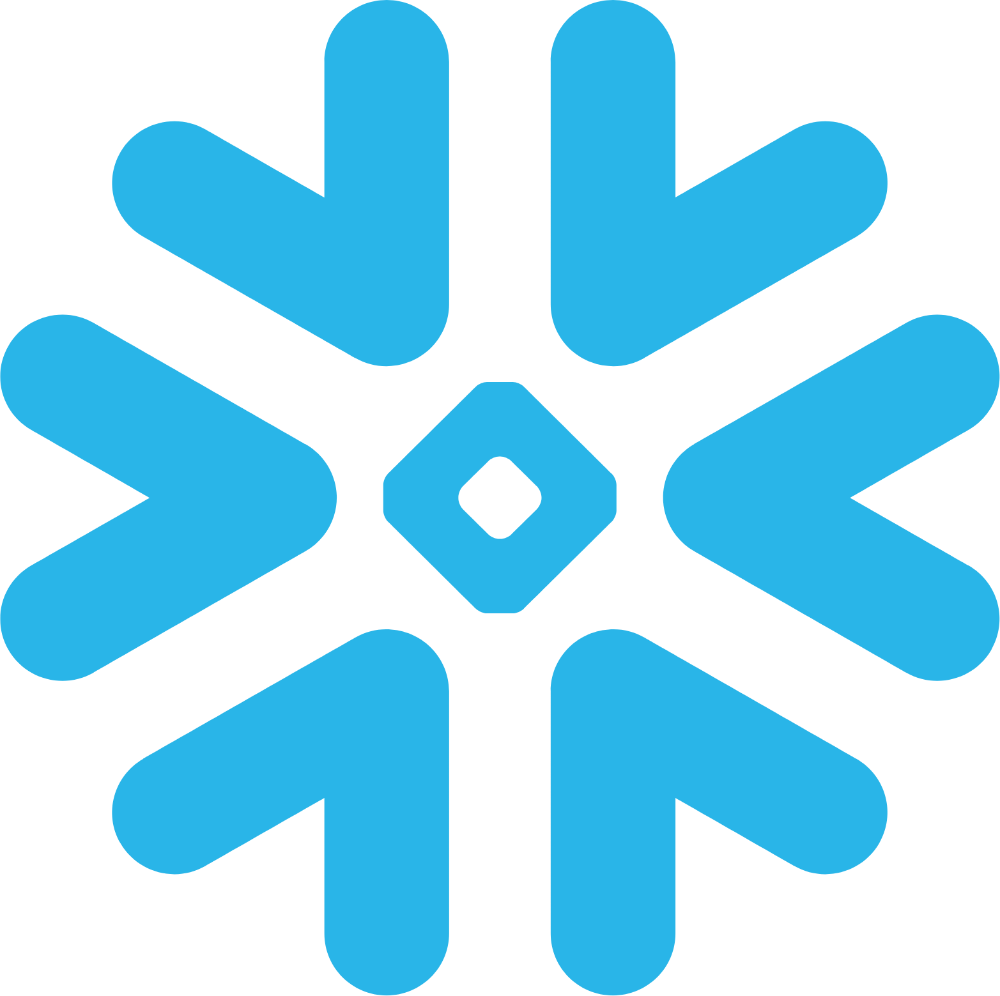

In [4]:

Data = pd.read_csv("E:/STU/Sales prediction advertisement.csv")
Data.head(4)

# Data inspection

In [5]:
Data.shape

(200, 4)

In [6]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   TV         200 non-null    float64
 1   Radio      200 non-null    float64
 2   Newspaper  200 non-null    float64
 3   Sales      200 non-null    float64
dtypes: float64(4)
memory usage: 6.4 KB



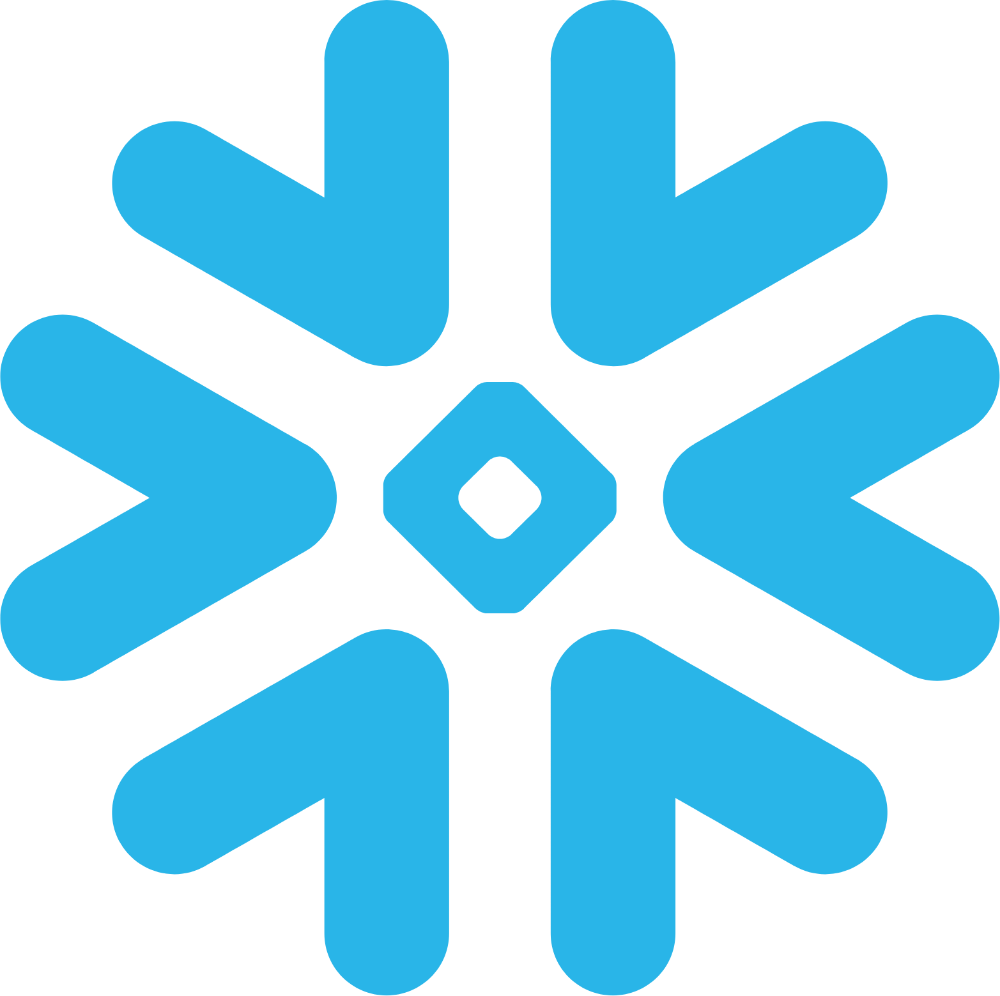

In [7]:
Data.describe().T


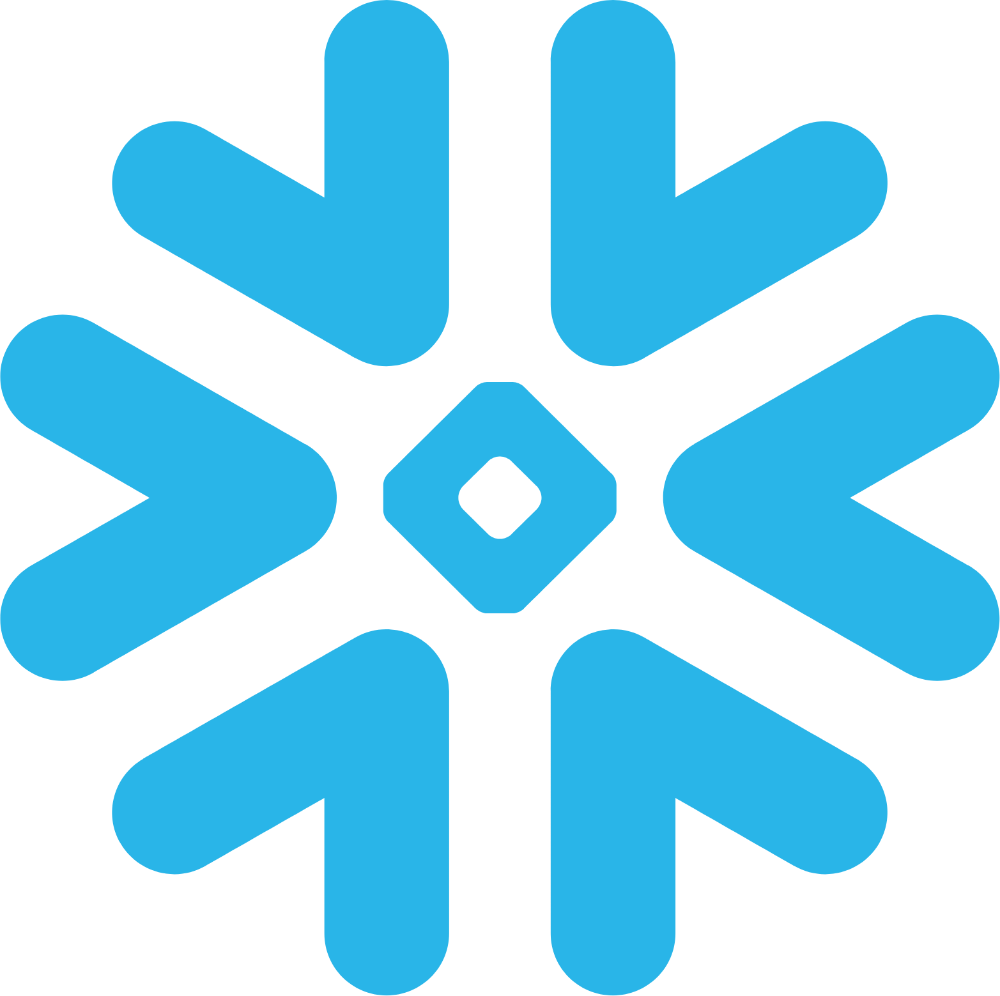

In [8]:
Data.describe()

# Data Cleaning

In [9]:
# Checking Null values
Data.isnull().sum()

TV           0
Radio        0
Newspaper    0
Sales        0
dtype: int64

In [10]:
# There are no considerable outliers present in the data.

In [11]:
Data.dtypes
#Data.isnull().sum()#
# # T is for Transpose

TV           float64
Radio        float64
Newspaper    float64
Sales        float64
dtype: object


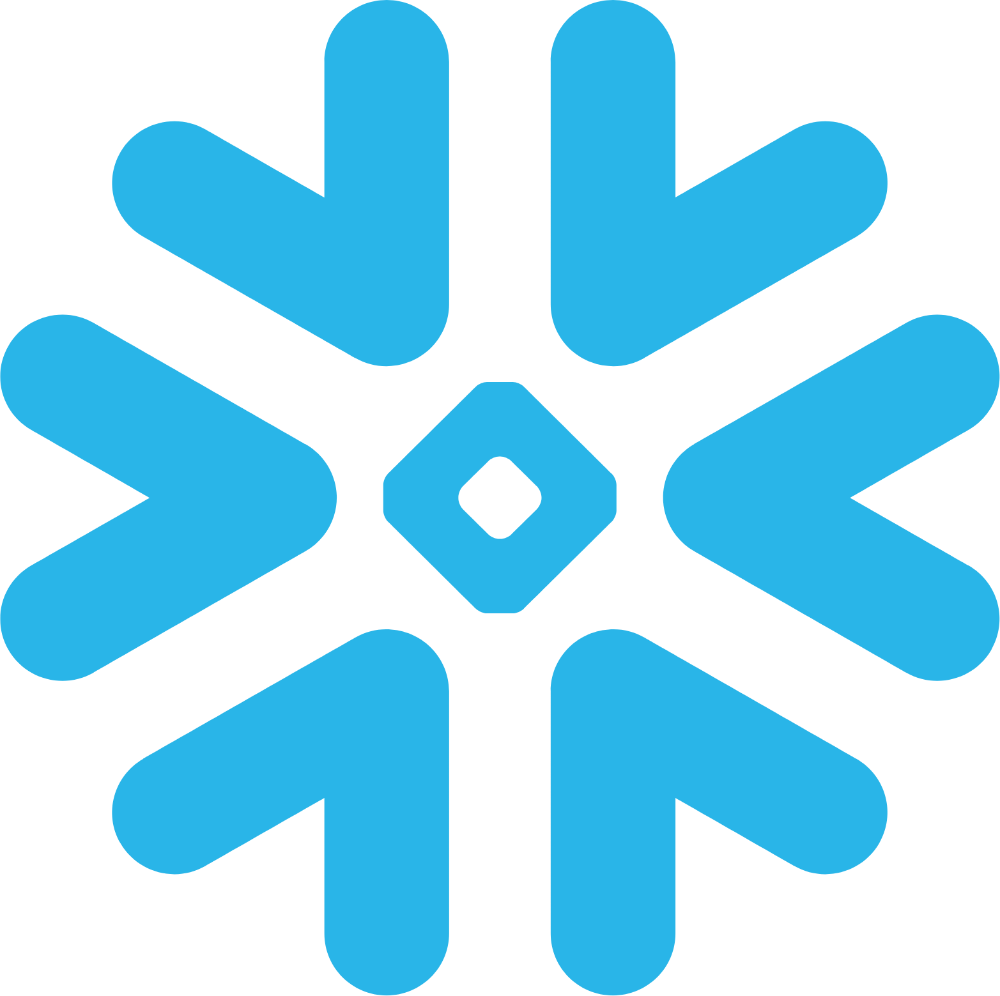

In [12]:
# Step 2 - EDA 

# EDA - Exploratory Data Analysis | Data Audit

# After importing : Immediate step is to get the friendship with the data.

# Regular available function

# Data.shape        # R : dim() 
# Data.columns    # R : names()
#Data.head(2)    # R : head()
# Data.tail(2)    # R : tail()
#Data.info()   # R : str()
Data.describe().T # R : summary()
# Data.isnull()

In [11]:
pandas_profiling.ProfileReport(Data) # complete HTML overall Summarised report 

 # This is one package for EDA doesnot means that it is the only package


# lot of other packages could be there for you to get the same job being done even more smartly 
# or in detailed EDA | What I may not have got the chance to look for ?
#__________________________________________________________________________________________________________________________
# SweetViz
# Pandas-Profiling
# Sweetviz
# Autoviz
# D-Tale
# AutoPlotter - A GUI based Exploratory Data Analysis in Python
# PyEDA



Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


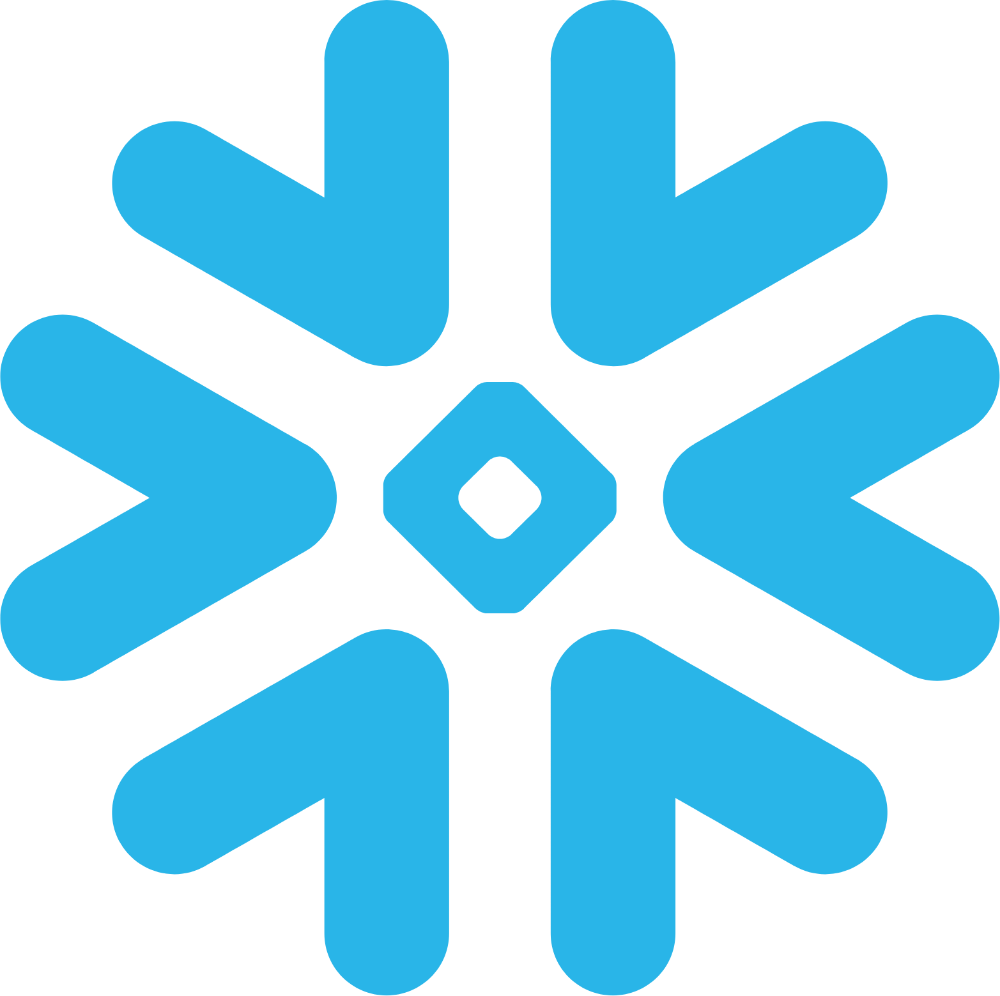

In [13]:
Data.head(2)

# Missing Values Treatment

In [14]:
# Handling Missings
# Fill with mean

Data['Sales']=Data['Sales'].fillna(Data['Sales'].mean())

In [15]:
# LET us Suppose | you are all done with Data Understanding | CLeaning 
#_______________________________________________________________________________
# Now you have to take care of REgression related Rules and assumption

In [16]:
# Distribution of variables
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

<Axes: xlabel='Sales', ylabel='Density'>

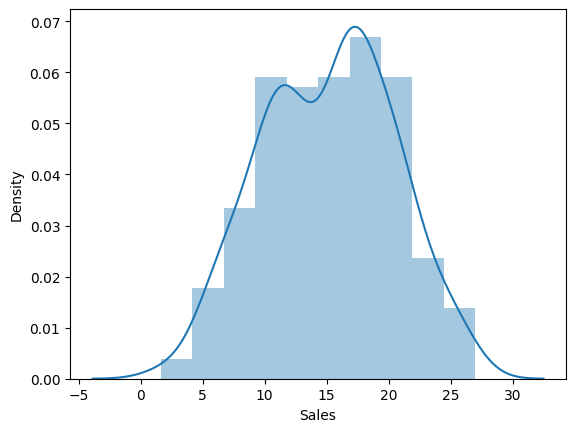

In [17]:
# To check the normality if Y[Sales]
#________________________________________________________________
# Choice 1- You could got the job being done with  - SEABORN PACKAGE
sns.distplot(Data.Sales) 

# Choice 2 - I could have got the same job being done with - PANDAS itself
#Data.Sales.hist() # uvivariate


<Axes: >

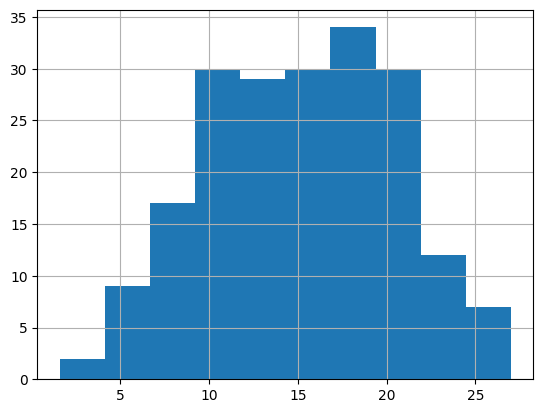

In [18]:
Data.Sales.hist()

<Axes: xlabel='Newspaper', ylabel='Density'>

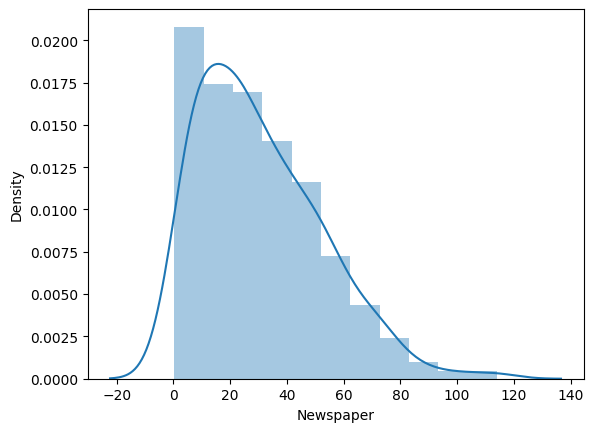

In [19]:
sns.distplot( Data.Newspaper )

<Axes: >

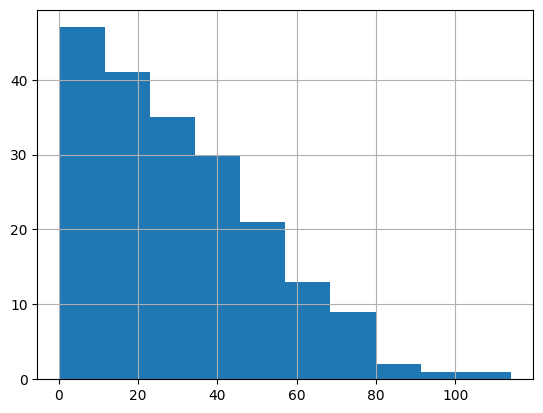

In [20]:
Data.Newspaper.hist()

<Axes: xlabel='Radio', ylabel='Density'>

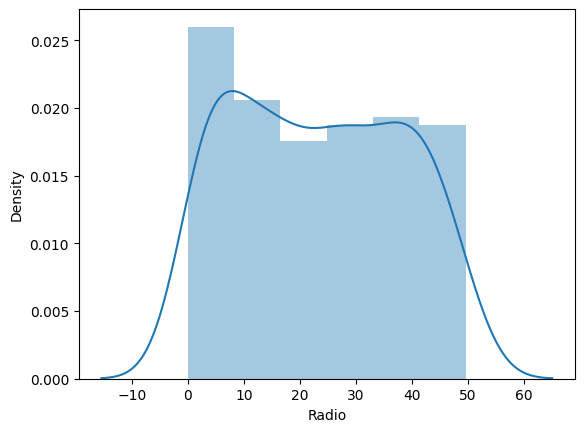

In [21]:
sns.distplot(Data.Radio)

<Axes: xlabel='TV', ylabel='Density'>

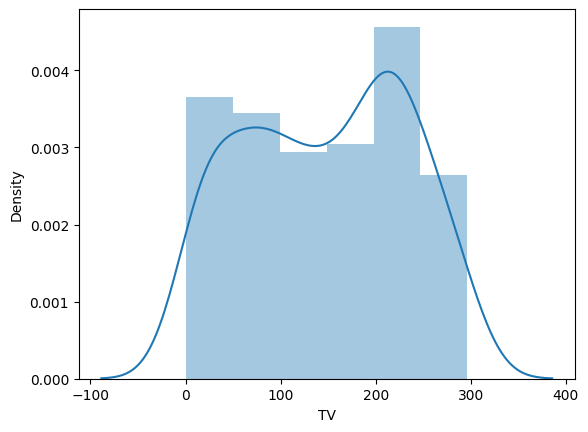

In [22]:
sns.distplot( Data.TV)

### Notes:
>Sales seems to be normal distribution. Spending on newspaper advertisement seems to be righ skewed.
Most of the spends on newspaper is fairly low where are spend on radio and tv seems be uniform distribution. 
Spends on tv are comparatively higher then spens on radio and newspaper.

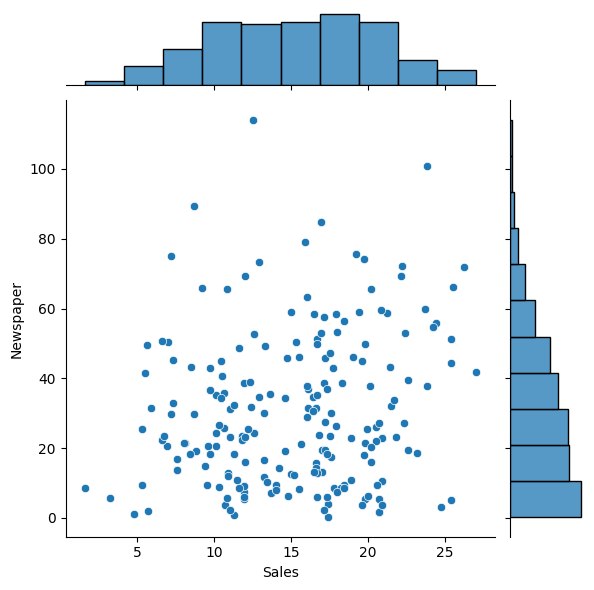

In [23]:
# Assumption No. 3  - Is there a relationship between sales and spend various advertising channels?

# Sales Vs. Newspaper advertisement spends
# Both Bi-variate(Scatter) + Univariate(Histogram)

# Correct usage with keyword arguments
sns.jointplot(x=Data['Sales'], y=Data['Newspaper'], kind='scatter')

##### This shows that Newspaper is not having strong relationship which violates the  3rd assumption of regression
##### Hence I can delete the variable right away 
#####  But I am not deleting in this case study at this step because I wanted you to see the statistical sense as well later on. is the reason I will continue with this as of now

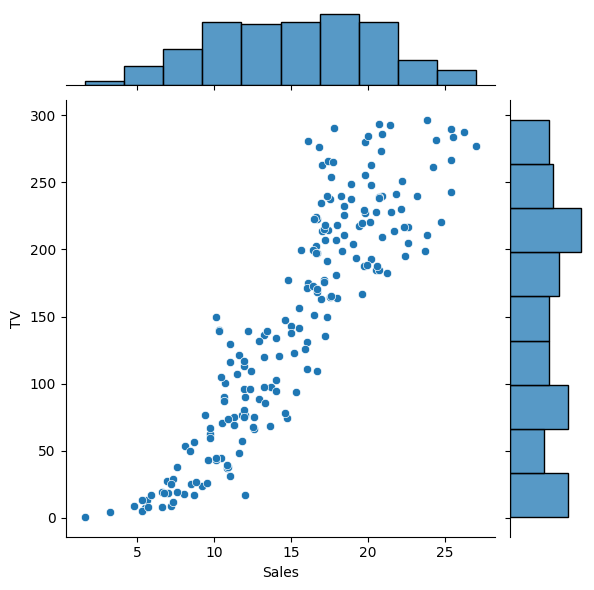

In [25]:
#Sales Vs. TV advertisement spends

sns.jointplot(x=Data['Sales'], y=Data['TV'], kind='scatter')

# Notes
>Sales and spend on newpaper is not highly correlaed where are sales and spend on tv is highly correlated.

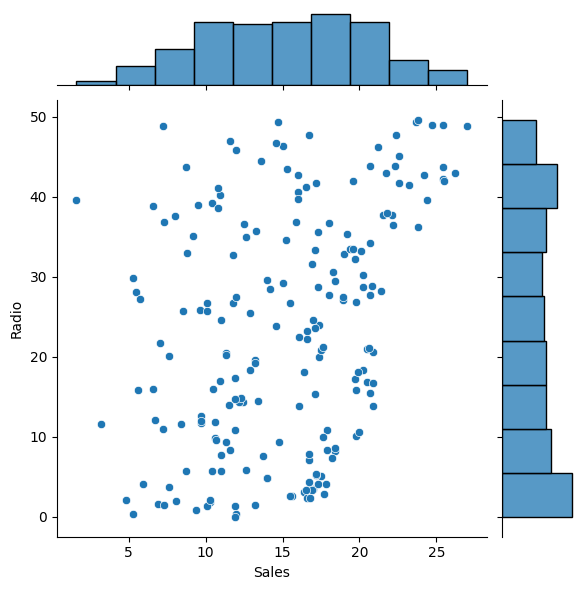

In [26]:
#Sales Vs. Radio advertisement spends

sns.jointplot(x=Data['Sales'], y=Data['Radio'], kind='scatter')

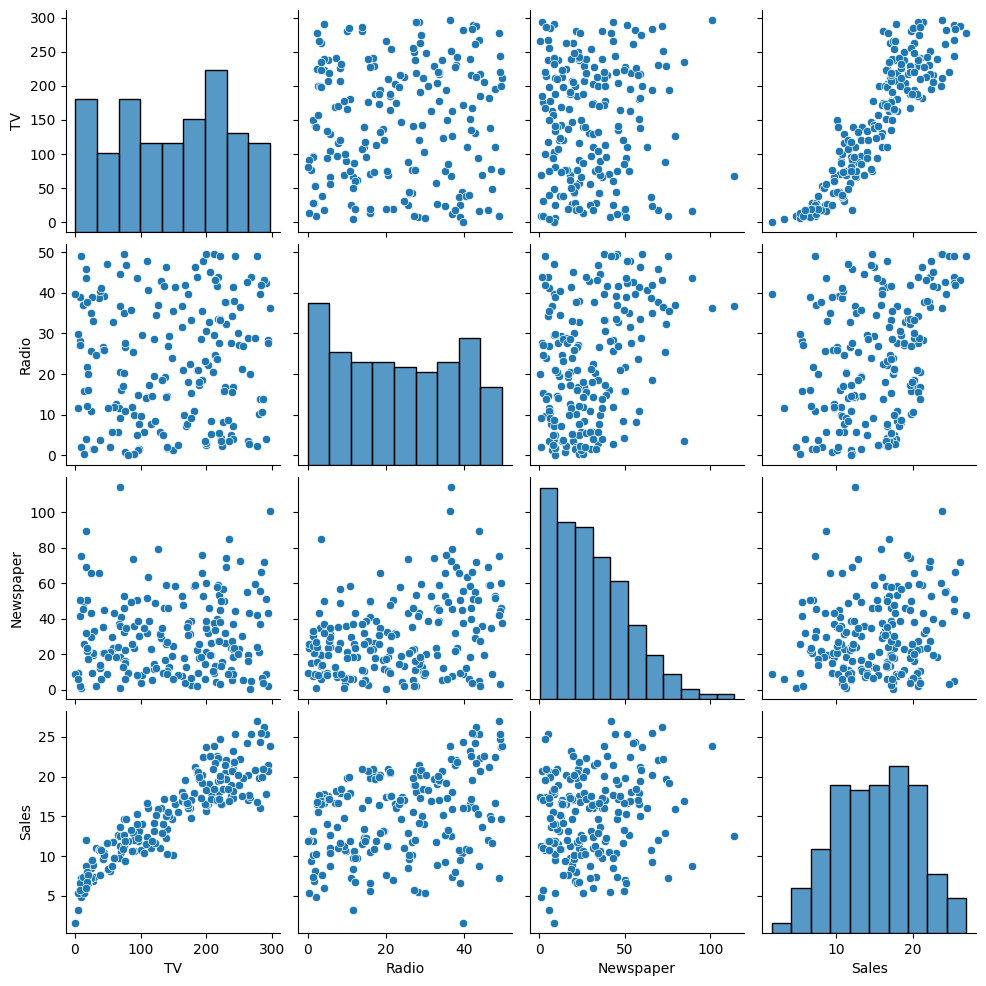

In [27]:
# Visualizing pairwise correleation )

sns.pairplot ( Data)

In [28]:
# Calculating correlations

Data.TV.corr( Data.Sales)

np.float64(0.9012079133023305)


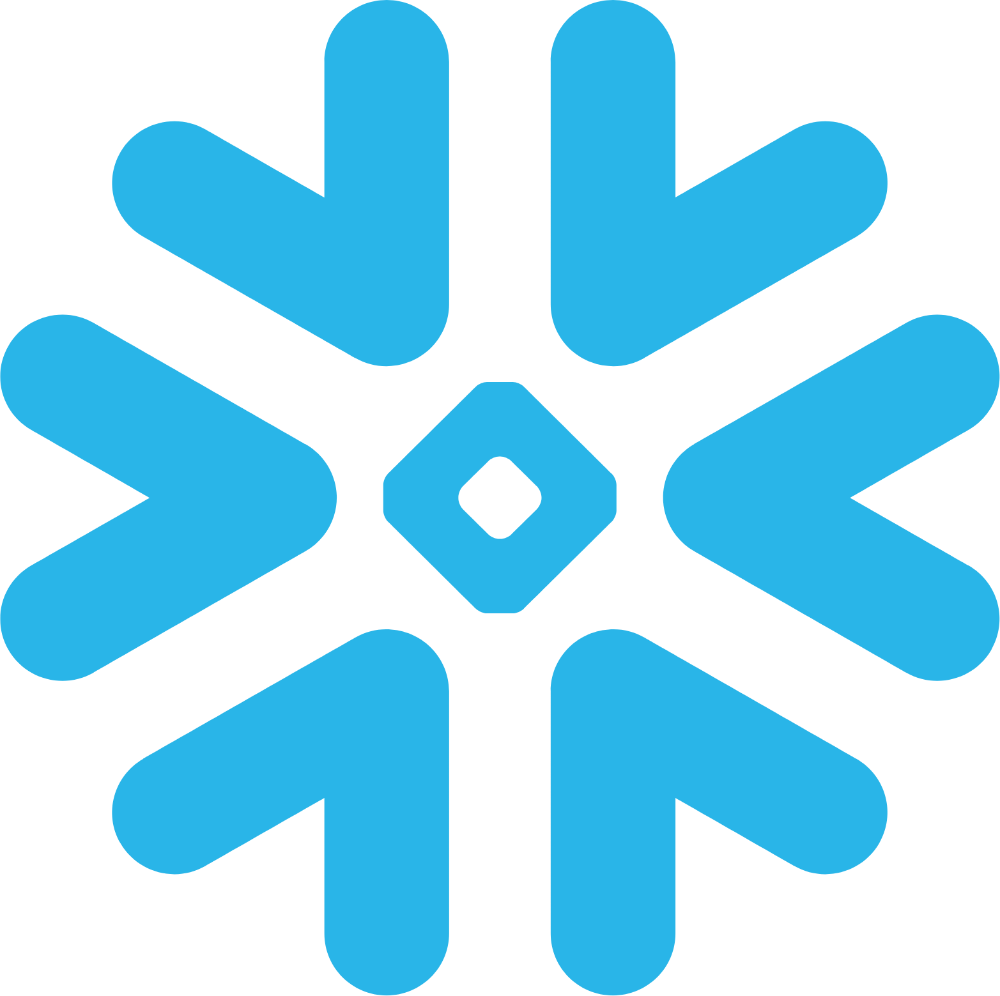

In [29]:
Data.corr()

<Axes: >

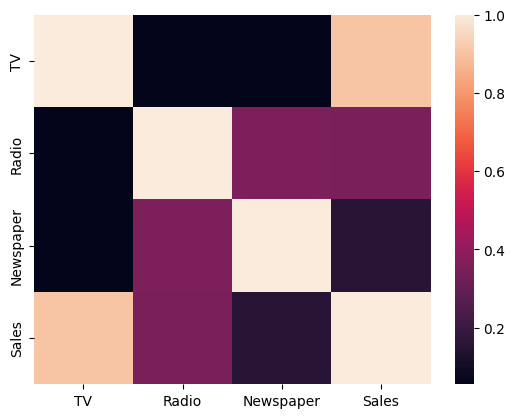

In [30]:
# Visualizing the correlations
#The darker is the color, the stronger is the correlation

sns.heatmap( Data.corr())

### NOTES:
> The diagonal of the above matirx shows the auto-correlation of the variables. It is always 1. You can observe that the correlation betweeb TV and Sales is highest i.e. 0.88 and then betweeb sales and radio
> correlations can vary from -1 to +1. Closer to +1 means strong positive correlation and close -1 means strong negative correlation. Closer to 0 means not very strongly correlated. 

### Building Regression Model
> Linear regression is an approach for modeling the relationship between a scalar dependent variable y and one or more explanatory variables (or independent variables) denoted X. The case of one explanatory variable is called simple linear regression. For more than one explanatory variable, the process is called multiple linear regression <br>
> A simple linear regression model is given by Y=mX+b <br>
> where m is the slope and b is the y-intercept. Y is the dependent variable and X is the explanatory variable. <br>
> Very briefly and simplistically, Linear Regression is a class of techniques for fitting a straight line to a set of data points

In [31]:
import statsmodels.formula.api as smf

import pandas as pd

#Python module - classes and functions for the estimation - statistical models, - smf


In [32]:
lm = smf.ols('Sales ~ TV + Radio + Newspaper', Data).fit() # Ordinary Least Square method : For Regression MOdel
# method for estimating the unknown parameters in a linear regression model.

In [33]:
lm.summary()

# Things to check and interpretation in the result SUMMARY
#_______________________________________________________________________________

# 1- R2                | IDeally it should be greater .60 - 
                         #After fitting a linear regression model, you need to determine how well the model fits the data
                           # % of variance in the dependent variable that the independent variables explain collectively
                                 #the strength of the relationship between your model 
# 2- ADjusted R2        | IDeally it should be close and similar to R2 | [R2 > = Adj R2]
# 3- there should not be much different begtween R2 and Adj R2 | Why ?

# 4- F STatistics - ANOVA
#   (generally used when to compare a second iterated model with the first previous one)

# 5- to check teh P value of each variable
#   to detect its sginificance in my model
    
# Ho - X1 is not having impact on Sales |
         # because >> Beta1 = 0

# Ha = Beta1 # 0
    
#     in this case News Paper is accepted having P 0.86> 0.05

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                     605.4
Date:                Fri, 25 Apr 2025   Prob (F-statistic):           8.13e-99
Time:                        07:42:19   Log-Likelihood:                -383.34
No. Observations:                 200   AIC:                             774.7
Df Residuals:                     196   BIC:                             787.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.6251      0.308     15.041      0.000       4.019       5.232
TV             0.0544      0.001     39.592      0.000       0.052       0.057
Radio          0.1070      0.008     12.604      0.000       0.090       0.124
Newspaper      0.0003      0.006      0.058      0.954      -0.011       0.012
==============================================================================
Omnibus:                       16.081   Durbin-Watson:                   2.251
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.655
Skew:                          -0.431   Prob(JB):                     9.88e-07
Kurtosis:                       4.605   Cond. No.                         454.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

##### rerunning the model again, removing the news paper from the list 

In [34]:
lm = smf.ols('Sales ~ TV + Radio', Data ).fit() # rerunning the model again, removing the news paper from the list 

In [35]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.902
Method:                 Least Squares   F-statistic:                     912.7
Date:                Fri, 25 Apr 2025   Prob (F-statistic):          2.39e-100
Time:                        07:42:39   Log-Likelihood:                -383.34
No. Observations:                 200   AIC:                             772.7
Df Residuals:                     197   BIC:                             782.6
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.6309      0.290     15.952      0.000       4.058       5.203
TV             0.0544      0.001     39.726      0.000       0.052       0.057
Radio          0.1072      0.008     13.522      0.000       0.092       0.123
==============================================================================
Omnibus:                       16.227   Durbin-Watson:                   2.252
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.973
Skew:                          -0.434   Prob(JB):                     8.43e-07
Kurtosis:                       4.613   Cond. No.                         425.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [36]:
# Getting model parameters
lm.params

Intercept    4.630879
TV           0.054449
Radio        0.107175
dtype: float64


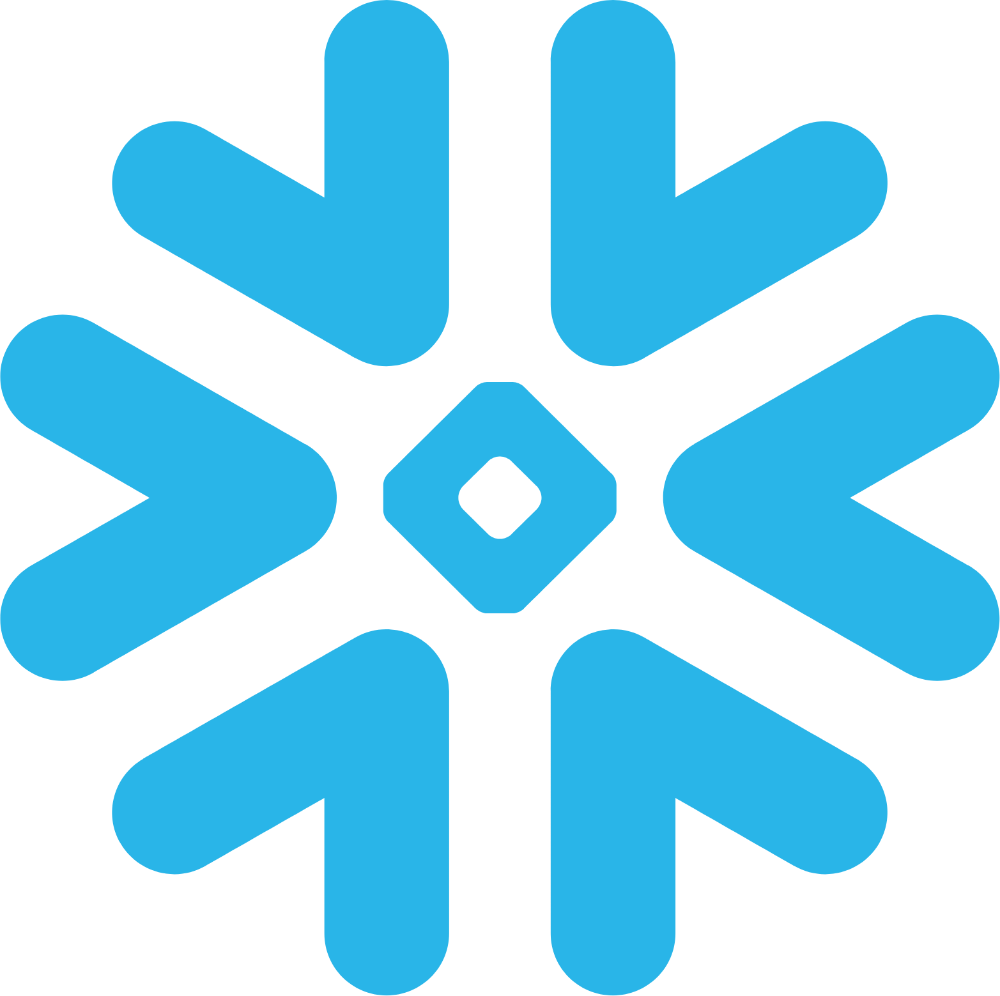

In [37]:
# Parameters at 95% confidence intervals

lm.conf_int()

In [45]:
from sklearn import metrics

### Evaluating Model Accuracy
> R-squared is a statistical measure of how close the data are to the fitted regression line. <br>
> R-square signifies percentage of variations in the reponse variable that can be explained by the model. <br>
> R-squared = Explained variation / Total variation <br>
> Total variation is variation of response variable around it's mean. <br>
> R-squared value varies between 0 and 100%. 0% signifies that the model explains none of the variability, <br>
> while 100% signifies that the model explains all the variability of the response. <br>
> The closer the r-square to 100%, the better is the model. <br>

In [38]:
lm.rsquared

np.float64(0.9025896186081139)

In [39]:
round(  float (lm.rsquared) , 2)

0.9

In [40]:
### MAKING PREDICTIONS - Applying the model 
ltmpredic = lm.predict(Data)

# ltmpredic - this is your Y cap

In [50]:
ltmpredic[1:10]

1    12.495023
2    11.907450
3    17.643745
4    15.883167
5    11.821011
6    12.432002
7    13.981450
8     7.037364
9    15.923810
dtype: float64

In [41]:
# After building the model,  now have to find teh accuracy ?
# ACcuracy can be maeasured with - RMSE 


from sklearn import metrics # Provides the Various Peformance Evaluation MAtrices either for Reg or classification

### Calculating mean square error ... RMSE
> RMSE calculate the difference between the actual value and predicted value of the response variable <br>
> The square root of the mean/average of the square of all of the error. <br> 
> Compared to the similar Mean Absolute Error, RMSE amplifies and severely punishes large errors. <br>
> The lesser the RMSE value, the better is the model.

In [42]:
mse =  metrics.mean_squared_error( Data.Sales, ltmpredic) 

In [43]:
rmse = np.sqrt ( mse)

In [44]:
rmse

np.float64(1.6450083823140504)

In [45]:
#Get the residuals and plot them
lm.resid[1:10]

1   -0.865819
2    1.513286
3   -0.806207
4    2.267263
5   -3.145422
6    0.522979
7   -0.076266
8   -0.524207
9   -0.188436
dtype: float64

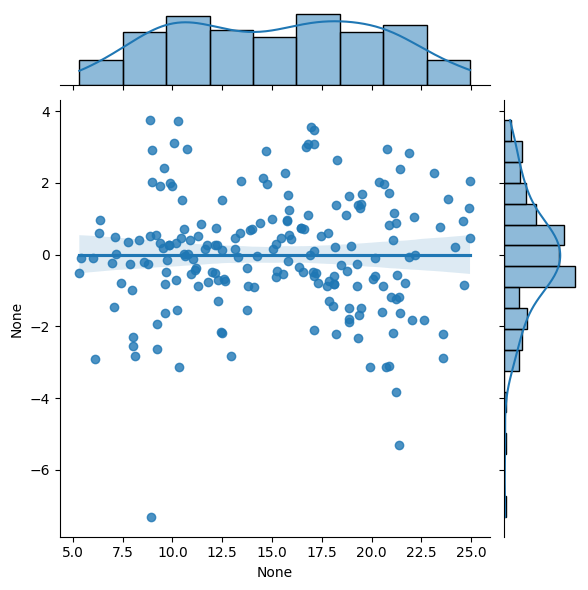

In [52]:

sns.jointplot(x=lm.fittedvalues, y=lm.resid, kind='reg')